In [1]:
#Dependencies
import pandas as pd
import numpy as np
from datetime import datetime
from langdetect import detect

from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

from nltk.tokenize import word_tokenize

from sklearn.feature_extraction.text import CountVectorizer

from sklearn.decomposition import PCA

from sklearn.cluster import KMeans

from scipy import stats

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import pickle

In [2]:
#Set Directory
%cd "C:\Users\lbrig\Documents\GRAD SCHOOL\Semester 3\Covid19 Kaggle"

C:\Users\lbrig\Documents\GRAD SCHOOL\Semester 3\Covid19 Kaggle


In [ ]:
#Import Dataset
kdf=pd.read_csv("KaggleData.csv", index_col=0)

In [ ]:
kdf.head()

In [ ]:
#Define a function to determine the language of each column, or nan if it can't determine it

start=datetime.now()

def doc_language(textstring):
    try: 
        return(detect(textstring))
    except:
        return(np.nan)
kdf["Detected Language"] = kdf["Document"].apply(doc_language)

end=datetime.now()
print("Run time: ", end-start)

In [ ]:
#Dump into pickle file
pickle.dump(kdf, open("kdfdf.pickle.dat", "wb")) 
print("Saved model to: kdfdf.pickle.dat")

In [3]:
#Start from here now---- to skip about a half hour of processing

kdf = pickle.load(open("kdfdf.pickle.dat", "rb")) 
print("Loaded model from: kdfdf.pickle.dat")

Loaded model from: kdfdf.pickle.dat


In [4]:
#Determine how many of each document are written in each language

pd.value_counts(kdf['Detected Language'])

en       32632
fr         321
es         280
de          73
it          14
pt          11
ca           4
pl           3
tl           3
ko           3
no           2
cy           2
id           2
lt           2
ru           2
so           2
af           2
da           2
et           2
ro           1
nl           1
zh-cn        1
Name: Detected Language, dtype: int64

In [5]:
#Create a subset kdfeng that only has the documents written in english
engl= kdf['Detected Language']=='en'
kdfeng=kdf[engl]


In [6]:
#Create a list of all the full documents in the English Doc subset
docs=[i for i in kdfeng['Document']]

In [7]:
#Create stopword list

stop_words = stopwords.words('english')
# Additions to the stop word list
stop_words.extend(["copyright", 'preprint', 'biorxiv', 'et', 'medrxiv'])

#Create porterstemmer
pstemmer = PorterStemmer()

In [8]:
#See stopwords
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
#Tokenize, remove nonalphabetic stuff (numbers, punctuation), remove stopwords
#ProccessedDoc is now a list of each document's remaining tokens in a list
start=datetime.now()

ProcessedDoc = []
for i, doc in enumerate(docs):
    # split into tokens and lowercase
    lcase= doc.lower()
    tokens = word_tokenize(lcase)

    # remove remaining tokens that are not alphabetic
    tokens = [word for word in tokens if word.isalpha()]

    # filter out stop words
    stoptokens = [w for w in tokens if not w in stop_words]
    
    #Stemming
    stemtokens = [pstemmer.stem(i) for i in stoptokens]

    ProcessedDoc.append(stemtokens)
    
end=datetime.now()

print("Run Time: ", end-start)

In [ ]:
kdfeng['Tokenized']=ProcessedDoc

In [ ]:
kdfeng.head()

In [ ]:
# #Dump into pickle file
pickle.dump(kdfeng, open("kdfeng.pickle.dat", "wb")) 
print("Saved model to: kdfeng.pickle.dat")

In [10]:
#Start from here to get kdfeng 

kdfeng = pickle.load(open("kdfeng.pickle.dat", "rb")) 
print("Loaded model from: kdfeng.pickle.dat")

Loaded model from: kdfeng.pickle.dat


In [11]:
ProcessedDoc= [i for i in kdfeng['Tokenized']]
kdfeng['Tokenized']=ProcessedDoc

In [12]:
#CountVectorizer 

start=datetime.now()

ProcessedDoc = ["<some_space>".join(x) for x in ProcessedDoc]

vect = CountVectorizer(max_features=4000, tokenizer = lambda x: x.split("<some_space>"), analyzer="word")

dtm=vect.fit_transform(ProcessedDoc)
    
print(dtm.shape)

end=datetime.now()
print("Run Time: ", end-start)

(32632, 4000)
Run Time:  0:01:03.898959


In [13]:
#Looking at the column names, which show the top 4000 words used
#Copy and pasting some into the stop-words and recreating this list
dtm.toarray()
print(vect.get_feature_names())
dtmfeats=vect.get_feature_names()

['aa', 'ab', 'abdomen', 'abdomin', 'aberr', 'abil', 'abl', 'abnorm', 'abolish', 'abort', 'abrog', 'abscess', 'absenc', 'absent', 'absolut', 'absorb', 'absorpt', 'abstract', 'abund', 'academ', 'acceler', 'accept', 'access', 'accessori', 'accommod', 'accompani', 'accomplish', 'accord', 'accordingli', 'account', 'accumul', 'accur', 'accuraci', 'ace', 'acet', 'acetyl', 'achiev', 'acid', 'acidosi', 'acknowledg', 'acquir', 'acquisit', 'across', 'act', 'actin', 'action', 'activ', 'actual', 'acut', 'ad', 'adapt', 'adaptor', 'add', 'addit', 'address', 'adenocarcinoma', 'adenosin', 'adenoviru', 'adenovirus', 'adequ', 'adher', 'adhes', 'adjac', 'adjust', 'adjuv', 'administ', 'administr', 'admiss', 'admit', 'adolesc', 'adopt', 'adren', 'adsorb', 'adsorpt', 'adult', 'adv', 'advanc', 'advantag', 'advers', 'advic', 'advis', 'ae', 'aerosol', 'aeruginosa', 'aetiolog', 'affect', 'affin', 'afford', 'aforement', 'africa', 'african', 'ag', 'agar', 'agaros', 'age', 'agenc', 'agent', 'agglutin', 'aggreg', 'a

C:\Users\lbrig\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


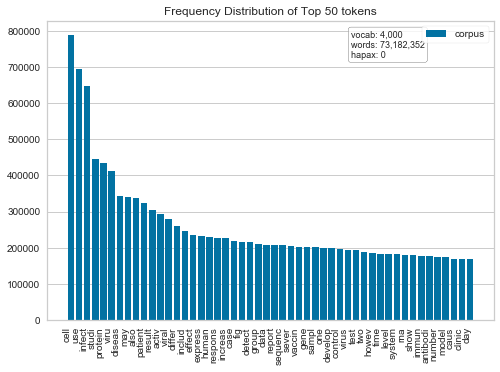

In [14]:
from yellowbrick.text import FreqDistVisualizer

visualizer = FreqDistVisualizer(features=dtmfeats, orient='v')
visualizer.fit(dtm)
visualizer.show()

In [15]:
#Next to convert to dataframe
dtmdf=pd.DataFrame(dtm.toarray(), columns=vect.get_feature_names())
dtmdf.head()

,aa,ab,abdomen,abdomin,aberr,abil,abl,abnorm,abolish,abort,...,δ,λ,μ,μg,μl,μm,τ,ϩ,ϫ,ϭ
0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,4,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,4,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
#Tfidf Vectorizer

start=datetime.now()

from sklearn.feature_extraction.text import TfidfVectorizer

#define vectorizer parameters
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, ngram_range=(1,2), min_df= 0.05, max_df=0.95, max_features= 10000, tokenizer = lambda x: x.split("<some_space>"), analyzer="word")

tfidf_matrix = tfidf_vectorizer.fit_transform(ProcessedDoc) #fit the vectorizer to synopses

print(tfidf_matrix.shape)

end=datetime.now()
print("Run time: ", end-start)

(32632, 3551)
Run time:  0:05:16.321183


In [ ]:
#print(tfidf_vectorizer.vocabulary_)

In [17]:
tfidffeats=tfidf_vectorizer.get_feature_names()

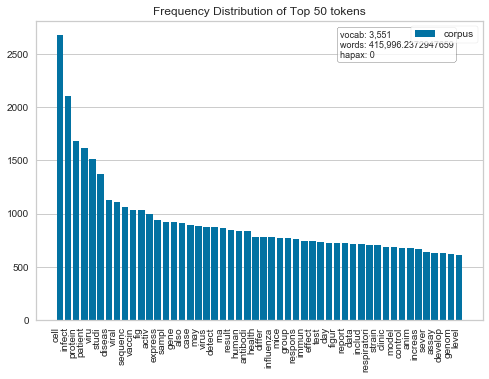

In [18]:
from yellowbrick.text import FreqDistVisualizer

visualizer = FreqDistVisualizer(features=tfidffeats, orient='v')
visualizer.fit(tfidf_matrix)
visualizer.show()

In [21]:
#Running KMeans
X = tfidf_matrix

start=datetime.now()

actualk = 6
modelk = KMeans(n_clusters=actualk, init='k-means++', max_iter=150, n_init=1)
kmeans=modelk.fit(X)
y_kmeans = kmeans.predict(X)



print("Top terms per cluster:")
#Ordering centroids by their cluster number
order_centroids = modelk.cluster_centers_.argsort()[:, ::-1]
terms = tfidf_vectorizer.get_feature_names()
#For each cluster, take the top 10 words with highest tfidf score and print them
for i in range(actualk):
    print("Cluster %d:" % i),
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind]),
    print

print("\n")

end=datetime.now()
print("Run time: ", end-start)



Top terms per cluster:
Cluster 0:
 vaccin
 immun
 antibodi
 cell
 mice
 respons
 viru
 antigen
 protein
 protect
Cluster 1:
 sequenc
 sampl
 gene
 genom
 strain
 viru
 detect
 rna
 virus
 pcr
Cluster 2:
 patient
 infect
 respiratori
 children
 studi
 pneumonia
 hospit
 case
 influenza
 clinic
Cluster 3:
 protein
 cell
 bind
 activ
 structur
 fig
 rna
 peptid
 residu
 compound
Cluster 4:
 cell
 infect
 express
 mice
 protein
 viru
 activ
 viral
 fig
 gene
Cluster 5:
 health
 diseas
 infect
 case
 studi
 outbreak
 model
 public
 may
 countri


Run time:  0:13:08.818396


In [22]:
#Assigning cluster labels
labeldf = kmeans.labels_

# Coordinates of cluster centers
centroids = kmeans.cluster_centers_

#Frequency distribution of cluster labels
stats.itemfreq(labeldf)

C:\Users\lbrig\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: `itemfreq` is deprecated!
`itemfreq` is deprecated and will be removed in a future version. Use instead `np.unique(..., return_counts=True)`
  


array([[   0, 1641],
       [   1, 4814],
       [   2, 5056],
       [   3, 5437],
       [   4, 6242],
       [   5, 9442]], dtype=int64)

In [23]:
#Add cluster values to dataframe of all English documents
clusters = labeldf.tolist()
kdfeng['Clusters']=clusters

In [ ]:
# from sklearn.decomposition import SparsePCA

# transformer = SparsePCA(n_components=5, random_state=0)
# X_transformed=transformer.fit_transform(tfidf_matrix.toarray())


In [ ]:
# fig = plt.figure(figsize = (50, 50))
# ax = plt.axes()
# plt.scatter(transformer[:, 0], transformer[:, 1], marker = "o", c = labeldf)
# plt.show()

In [24]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD

k = 6
tfs_reduced = TruncatedSVD(n_components=k, random_state=0).fit_transform(tfidf_matrix)

tfs_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(tfs_reduced)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 32632 samples in 0.116s...
[t-SNE] Computed neighbors for 32632 samples in 4.271s...
[t-SNE] Computed conditional probabilities for sample 1000 / 32632
[t-SNE] Computed conditional probabilities for sample 2000 / 32632
[t-SNE] Computed conditional probabilities for sample 3000 / 32632
[t-SNE] Computed conditional probabilities for sample 4000 / 32632
[t-SNE] Computed conditional probabilities for sample 5000 / 32632
[t-SNE] Computed conditional probabilities for sample 6000 / 32632
[t-SNE] Computed conditional probabilities for sample 7000 / 32632
[t-SNE] Computed conditional probabilities for sample 8000 / 32632
[t-SNE] Computed conditional probabilities for sample 9000 / 32632
[t-SNE] Computed conditional probabilities for sample 10000 / 32632
[t-SNE] Computed conditional probabilities for sample 11000 / 32632
[t-SNE] Computed conditional probabilities for sample 12000 / 32632
[t-SNE] Computed conditional probabilities for sa

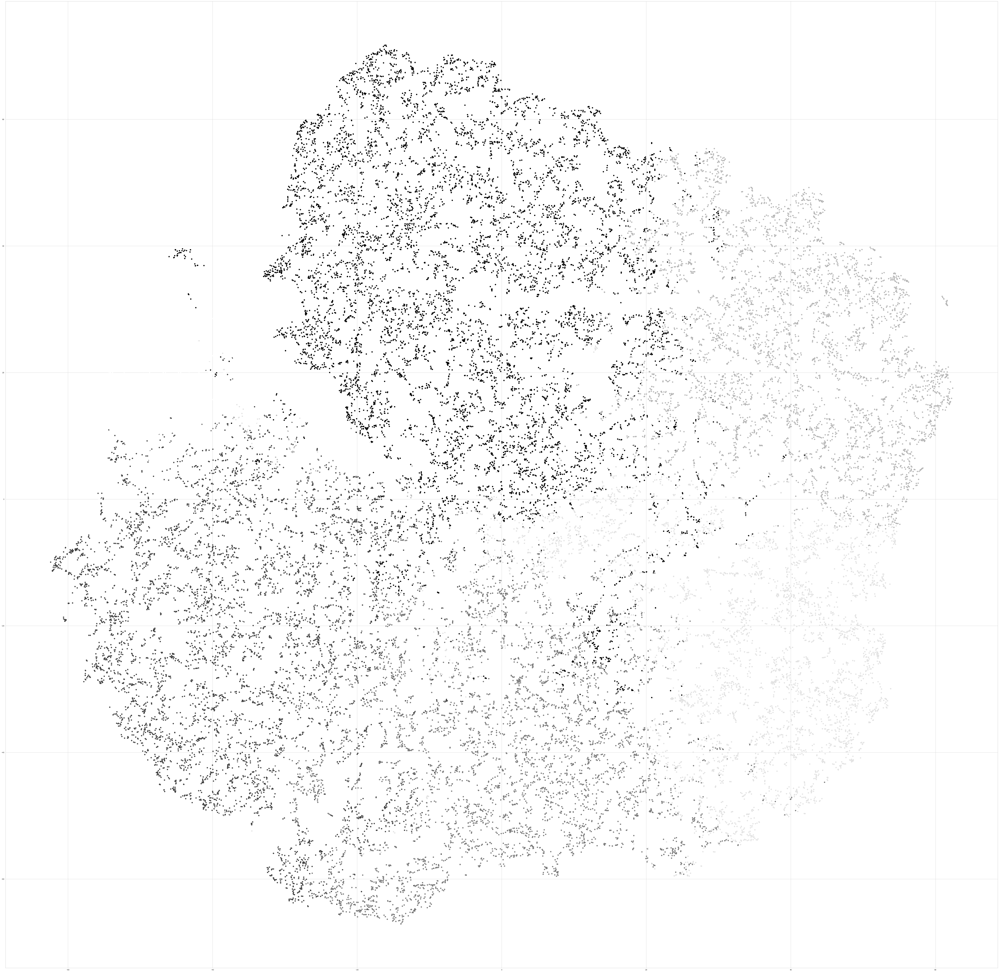

In [25]:
fig = plt.figure(figsize = (100, 100))
ax = plt.axes()
plt.scatter(tfs_embedded[:, 0], tfs_embedded[:, 1], marker = "o", c = labeldf)
plt.show()

In [26]:
#PCA to plot 
start=datetime.now()

pca = PCA(n_components=2).fit_transform(tfs_reduced)

end=datetime.now()
print("Run time: ", end-start)

Run time:  0:00:00.088930


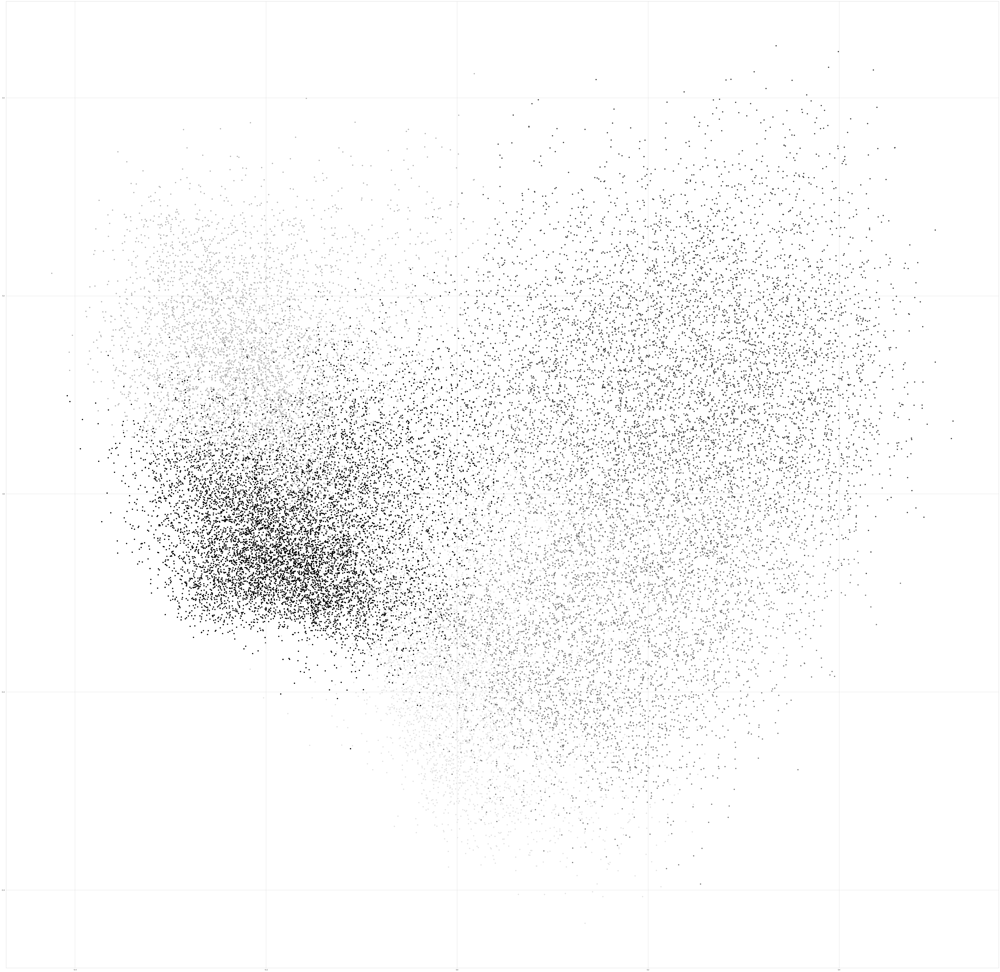

In [27]:
fig = plt.figure(figsize = (100, 100))
ax = plt.axes()
plt.scatter(pca[:, 0], pca[:, 1], marker = "o", c = labeldf)
plt.show()